In [10]:
# imports

import os
from glob import glob
import cv2 # opencv
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

In [11]:
base_dir = '/Users/dkessner/Desktop/data/Kather_texture_2016_image_tiles_5000'


In [12]:
## Get labels of all classes in this dataset
img_labels = [i for i in os.listdir(base_dir) if not i.startswith('.')]
print('There are {} classes in this dataset:\n{}'.format(len(img_labels), img_labels))

There are 8 classes in this dataset:
['02_STROMA', '06_MUCOSA', '05_DEBRIS', '01_TUMOR', '03_COMPLEX', '08_EMPTY', '04_LYMPHO', '07_ADIPOSE']


In [13]:
tumor_files = glob(os.path.join(base_dir, img_labels[0], '*.tif'))
stroma_files = glob(os.path.join(base_dir, img_labels[1], '*.tif'))
complex_files = glob(os.path.join(base_dir, img_labels[2], '*.tif'))
lympho_files = glob(os.path.join(base_dir, img_labels[3], '*.tif'))
debris_files = glob(os.path.join(base_dir, img_labels[4], '*.tif'))
mucosa_files = glob(os.path.join(base_dir, img_labels[5], '*.tif'))
adipose_files = glob(os.path.join(base_dir, img_labels[6], '*.tif'))
empty_files = glob(os.path.join(base_dir, img_labels[7], '*.tif'))
img_files = [tumor_files, stroma_files, complex_files, lympho_files, debris_files, mucosa_files, adipose_files, empty_files]
total_files = [img for folder in img_files for img in folder]

In [14]:
len(total_files)

5000

In [15]:
print('Total number of images in this dataset: {}'.format(len(total_files)))
print ('-'*50)
for i in range(8):
    print('Number of images for {} category: {}'.format(img_labels[i].split('_')[1], len(img_files[i])))

Total number of images in this dataset: 5000
--------------------------------------------------
Number of images for STROMA category: 625
Number of images for MUCOSA category: 625
Number of images for DEBRIS category: 625
Number of images for TUMOR category: 625
Number of images for COMPLEX category: 625
Number of images for EMPTY category: 625
Number of images for LYMPHO category: 625
Number of images for ADIPOSE category: 625


In [16]:
## OpenCV loads color images in BGR mode. For visualization by matplotlib, images need to be converted to RGB mode
def readImage_rgb(img_path):
    '''OpenCV loads color images in BGR mode and converts to RGB mode for visualization;
       output: (H x W x n_channel)'''
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb

In [17]:
img = readImage_rgb(img_files[0][0])
print(img.shape)

(150, 150, 3)


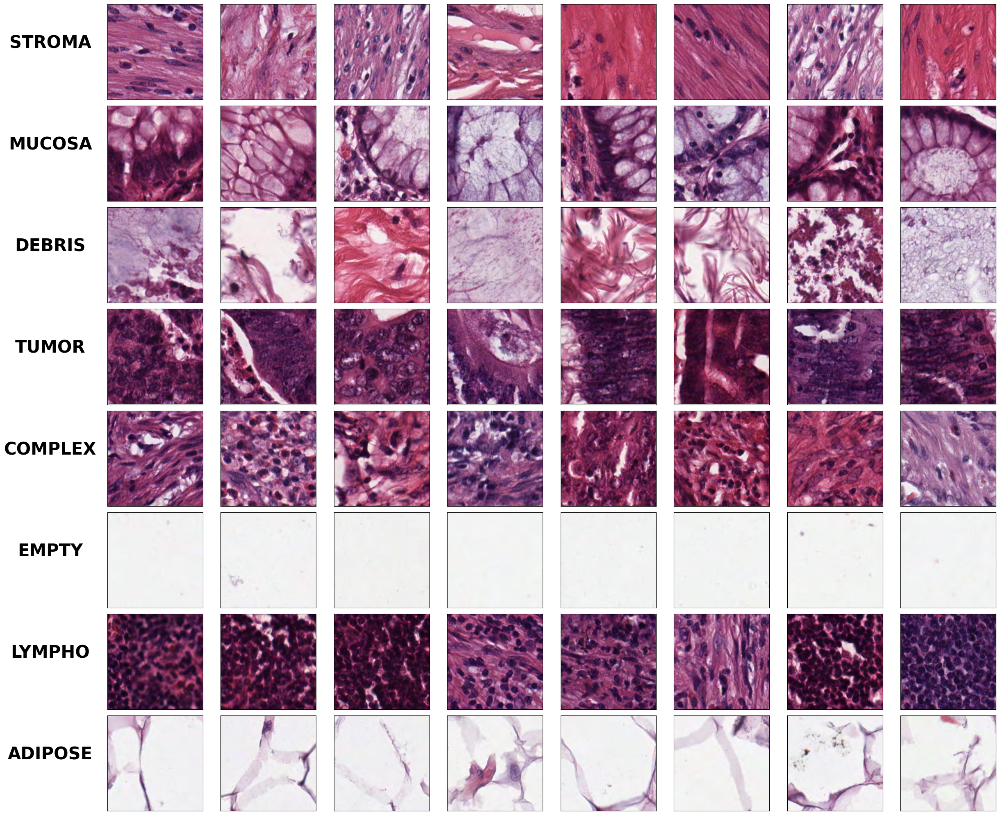

In [18]:
def plotImage_cat(img_files, img_labels):
    fig = plt.figure(figsize=(25,20))
    for i in np.arange(len(img_labels)):
        img_paths = img_files[i]
        img_label = img_labels[i]
        np.random.shuffle(img_paths)
        img_paths = img_paths[:8]
        for j, img_path in enumerate(img_paths):
            fig.add_subplot(8,8,i*8+j+1, xticks = [], yticks = [])
            plt.imshow(readImage_rgb(img_path))
            if j == 0:
                plt.ylabel(img_label.split('_')[1], rotation = 0, labelpad=100, fontsize=30, fontweight = 'bold')
    plt.tight_layout()    
    #fig.savefig('Histology.png')
plotImage_cat(img_files, img_labels)

In [21]:
def plotImage_rgb(img_paths, img_label):
    '''Plot image in each of RGB (red/green/blue) channels separately and in RGB mode'''
    np.random.shuffle(img_paths)
    img_path = img_paths[0]
    img_rgb = readImage_rgb(img_path)
     
    fig = plt.figure(figsize=(20,8))
    channels = ['Red', 'Green', 'Blue']
    color = ['r','g','b']
    
    for idx in np.arange(3):
        plt.subplot(1,4,idx+1)
        img = img_rgb[:,:,idx]
        plt.imshow(img, cmap = 'gray')
        plt.title(channels[idx], color = color[idx], fontsize = 30)
        
    plt.subplot(1,4,4)
    plt.imshow(img_rgb)
    plt.title('RGB', fontsize = 30)
    fig.suptitle('H&E image of {} area'.format(img_label), fontsize = 36) 
    
    plt.tight_layout()
    

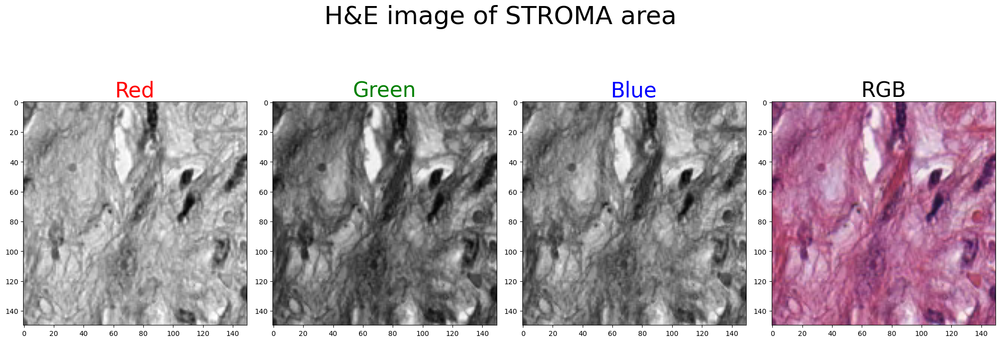

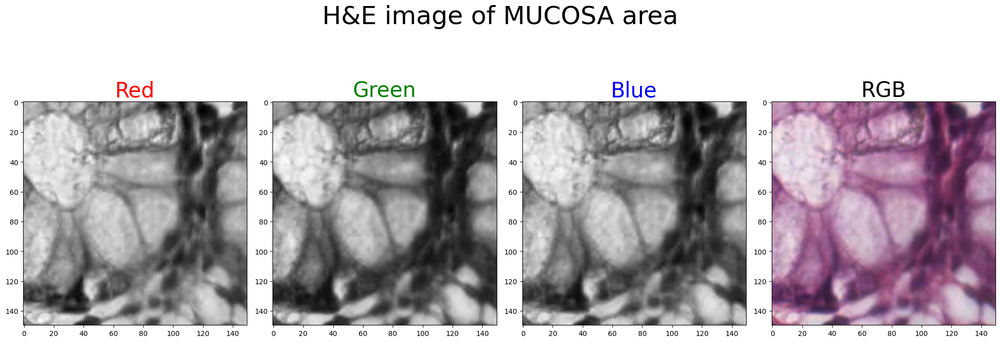

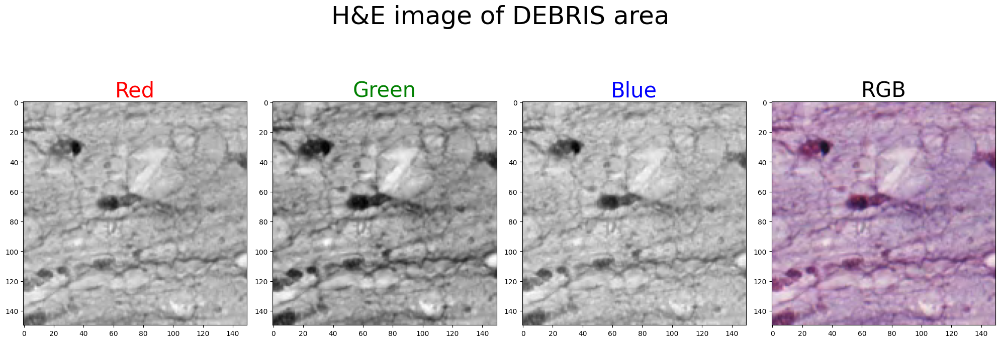

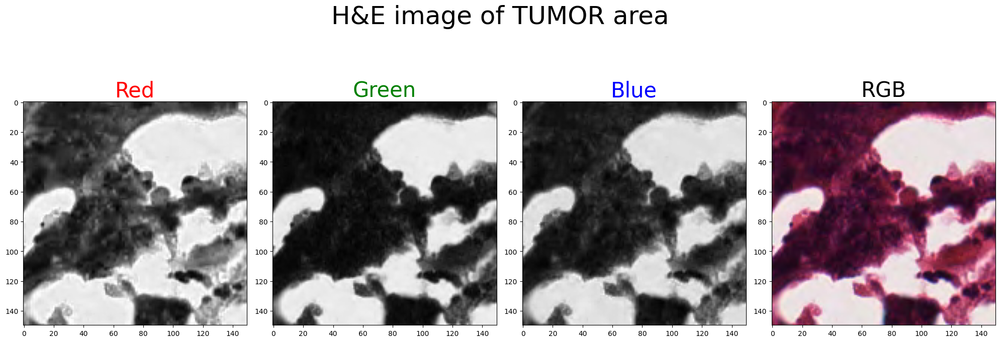

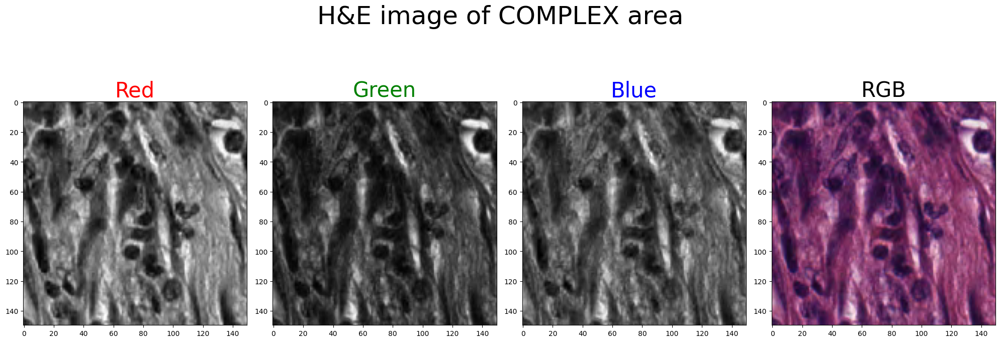

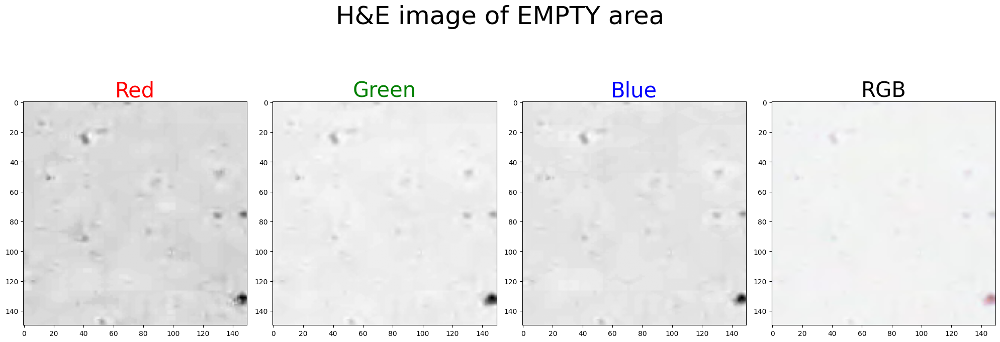

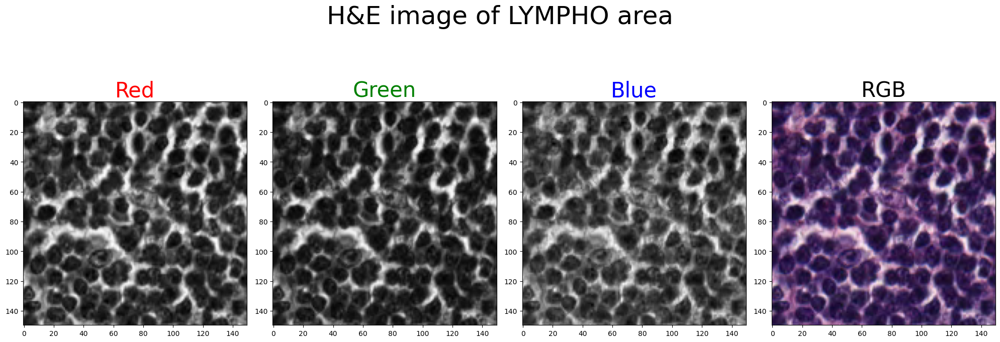

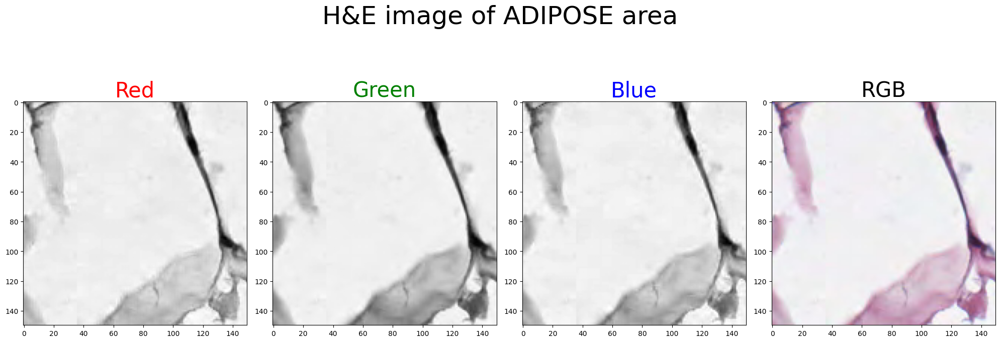

In [22]:
for i in np.arange(8):
    plotImage_rgb(img_files[i], img_labels[i].split('_')[1])